In [10]:
import sys
sys.path.append('/home/lumargot/trachoma/src/py')

import os 
os.environ["CUDA_VISIBLE_DEVICES"] = "1" # put -1 to not use any

In [11]:
import os
import pandas as pd
import numpy as np 

import torch
import cv2
torch.set_float32_matmul_precision('medium')

from nets import classification
from loaders.tt_dataset import TTDataModulePatch, TrainTransformsFullSeg, EvalTransformsFullSeg, BBXImageTrainTransform
from nets.classification import EfficientNetV2SYOLTPatchv2

from sklearn.utils import class_weight
from tqdm import tqdm
import matplotlib.pyplot as plt
import torchvision
from torch.utils.data import DataLoader
import SimpleITK as sitk
from matplotlib.patches import Rectangle


In [12]:
from PIL import Image

In [13]:
folder = '/CMF/data/lumargot/trachoma/PoPP_Data/mtss/corrected_segmentation'
files = os.listdir(folder)

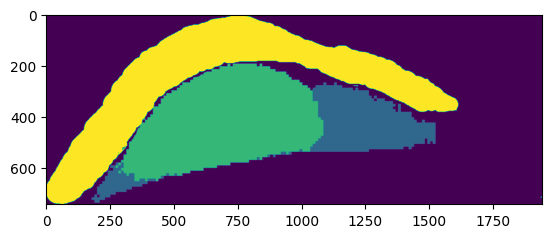

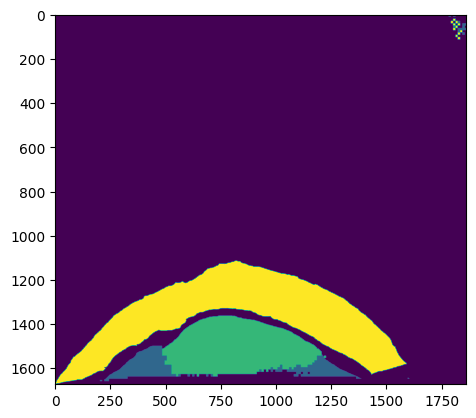

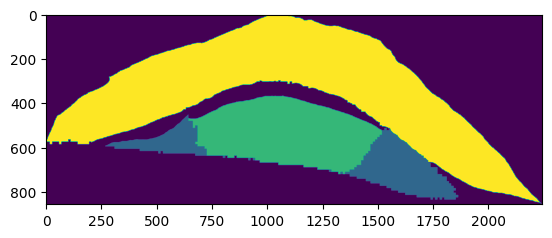

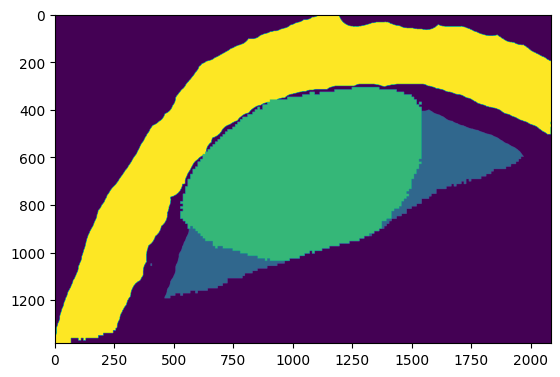

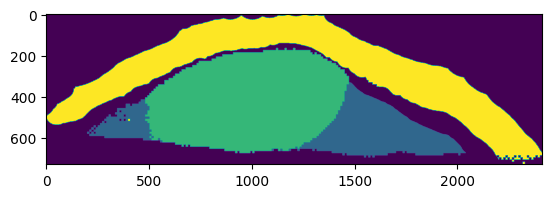

...

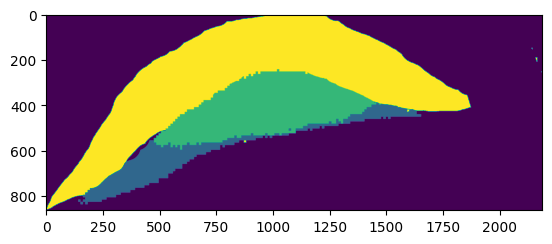

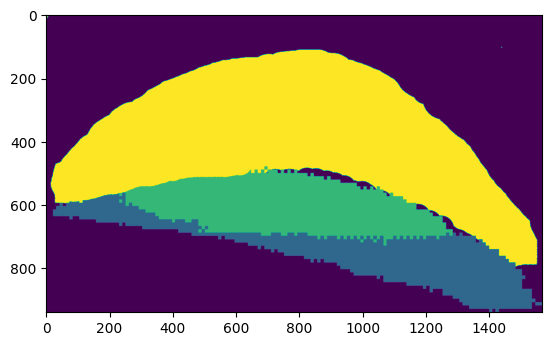

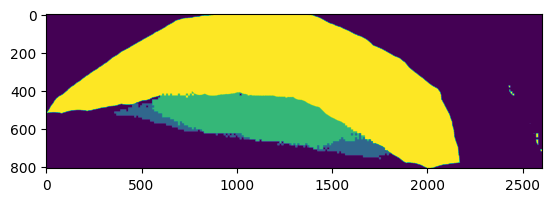

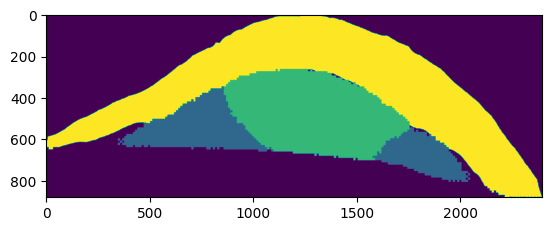

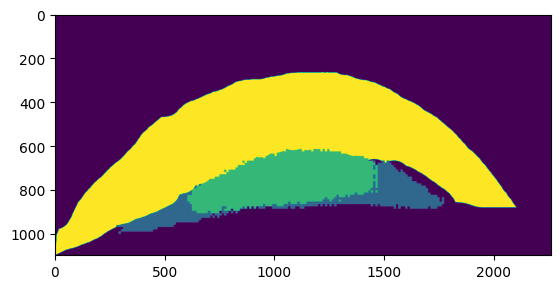

In [15]:
for file in files[:20]:
    seg_path = os.path.join(folder, file)
    if (os.path.splitext(seg_path)[1] == '.nrrd'):
        seg  = np.squeeze(sitk.GetArrayFromImage(sitk.ReadImage(seg_path)))
        plt.imshow(seg)
        plt.show()


In [ ]:

# def compute_patch_size(seg, pad):
#   seg = torch.Tensor(seg)
#   shape = seg.shape

#   ij = torch.argwhere(seg.squeeze() ==3 )
#   bb = torch.tensor([0, 0, 0, 0]) # xmin, ymin, xmax, ymax

#   bb[0] = torch.clip(torch.min(ij[:,1]) - pad, 0, shape[1])
#   bb[1] = torch.clip(torch.min(ij[:,0]) - pad, 0, shape[0])
#   bb[2] = torch.clip(torch.max(ij[:,1]) + pad, 0, shape[1])
#   bb[3] = torch.clip(torch.max(ij[:,0]) + pad, 0, shape[0])


#   patch_w = (bb[2] - bb[0])/10

#   patch_size = max(int(patch_w), 256)
#   print(patch_size)
#   return patch_size, bb

# def compute_patch_location(seg, pad=29, step=20):
#   y, x = np.where(seg == 3)	

#   z = np.polyfit(x, y, 3)
#   poly = np.poly1d(z)

#   x_axis = np.arange(pad, seg.shape[-1]-pad , step=step)
#   y_axis = poly(x_axis)
#   return x_axis, y_axis

# def extract_patches(image, x_list, y_list, patch_sz):
#   patches = []
#   for (x_center, y_center) in zip(x_list,y_list):
#     y_center=int(y_center)
#     y_center = max(patch_sz, y_center)
#     y_center = min(image.shape[0] - patch_sz, y_center)

#     x_center = max(patch_sz, x_center)
#     x_center = min(image.shape[1] - patch_sz, x_center)
    
#     patch = image[y_center-patch_sz:y_center+patch_sz, x_center-patch_sz:x_center+patch_sz]
#     patches.append(patch)
#   return np.stack(patches, axis=0)

# def isPointInBoundingBox(point, bb, delta=20):
#     x1, y1, x2, y2 = bb
#     x, y = point
#     if (x1 + delta  <= x <= x2 -delta):
#       if (y1 +delta <= y <= y2 +delta):
#         return True
#     return False

In [5]:
# img_dir = '/CMF/data/lumargot/trachoma/PoPP_Data/mtss/img'
# seg_dir = '/CMF/data/lumargot/trachoma/PoPP_Data/mtss/seg'
# csv_dir = '/CMF/data/lumargot/trachoma/PoPP_Data/mtss/csv_patches'
# out_dir = '/CMF/data/lumargot/trachoma/PoPP_Data/mtss/patches'


# csv_list = os.listdir(csv_dir)
# num_subject = len(csv_list)
# cpt=0
# cpt_good = 0
# for index_csv in range(num_subject):
#   csv_name = csv_list[index_csv]
#   csv_file = os.path.join(csv_dir, csv_name)

#   df = pd.read_csv(csv_file)
#   num_patches = len(df)
#   subject_name = os.path.splitext(csv_name)[0]
#   subject_path = os.path.join(img_dir, subject_name+'.jpg')
#   seg_path =  os.path.join(seg_dir, subject_name+'.nrrd')

#   image  = np.squeeze(sitk.GetArrayFromImage(sitk.ReadImage(subject_path)))
#   seg  = np.squeeze(sitk.GetArrayFromImage(sitk.ReadImage(seg_path)))
#   H,W = image.shape[:2]

#   patch_sz, bbx_seg = compute_patch_size(seg, pad=1)
#   seg_cropped = seg[bbx_seg[1]:bbx_seg[3], bbx_seg[0]: bbx_seg[2]] ## seg crop is ok 
#   # img_cropped = image[bbx_seg[1]:bbx_seg[3], bbx_seg[0]: bbx_seg[2]] #
#   x_axis, y_axis = compute_patch_location(seg_cropped, pad=patch_sz, step=int(patch_sz/1.5))
#   print(f"{index_csv} / {num_subject} with {len(x_axis)} patches")

#   # from crop to full size values
#   x_axis += bbx_seg[0].numpy()
#   y_axis += bbx_seg[1].numpy()

#   for (x_center, y_center) in zip(x_axis,y_axis):
#     y_center=int(y_center)
#     y_center = max(patch_sz, y_center)
#     y_center = min(image.shape[0] - patch_sz, y_center)

#     x_center = max(patch_sz, x_center)
#     x_center = min(image.shape[1] - patch_sz, x_center)

#     bb = [x_center-patch_sz, y_center-patch_sz, x_center+patch_sz, y_center+patch_sz]
#     patch = image[bb[1]:bb[3], bb[0]:bb[2]]

#     labels = set()
#     for idx, row in df.iterrows():
#       x,y, label = row['x'], row['y'], row['label']
#       if '/' in label:
#         label = label.replace('/', '_')
#       if isPointInBoundingBox((x,y), bb, delta=5):        
#         labels.add(label)

#     # if no labels -> not in bbx. if more than 1, outcomes conflict
#     labels = list(labels)

#     if len(labels) > 1 and 'Healthy' in labels:
#       labels.remove('Healthy')
      
#     if len(labels) == 1:
#       img_tmp = cv2.resize(patch, (512, 512), interpolation=cv2.INTER_CUBIC)
#       cpt_good+=1

#       pi_up_img = Image.fromarray(img_tmp)
#       name = f"patch_{subject_name}_{x_center}x_{y_center}y_class_{labels[0]}.png"
#       pi_up_img.save(os.path.join(out_dir, name))



In [4]:
# csv_train= '/CMF/data/lumargot/trachoma/patches/csv/new/Pret_excluded_clean_fold0_test.csv'
# csv_valid= '/CMF/data/lumargot/trachoma/patches/csv/new/Pret_excluded_clean_fold0_test.csv'
# csv_test= '/CMF/data/lumargot/trachoma/patches/csv/new/Pret_excluded_clean_fold0_test.csv'
# mount_point= '/CMF/data/lumargot/trachoma/B images one eye'


csv_train= '/CMF/data/lumargot/trachoma/PoPP_Data/mtss/csv/popp_mtss_patches_train.csv'
csv_valid= '/CMF/data/lumargot/trachoma/PoPP_Data/mtss/csv/popp_mtss_patches_train_test.csv'
csv_test= '/CMF/data/lumargot/trachoma/PoPP_Data/mtss/csv/popp_mtss_patches_test.csv'
mount_point= '/CMF/data/lumargot/trachoma/PoPP_Data/mtss/'


concat_labels=['overcorrection', 'Short Incision', 'Entropion', 'ECA', 'Gap']
drop_labels = None
img_column= "filename" 
class_column = 'class'
label_column = 'label'
# seg_column= "seg" 
map = {'0':'Healthy', '1':'Bad', '2': 'Reject'}

In [5]:
def remove_labels(df, class_column, label_column, drop_labels=None, concat_labels=None):

  if drop_labels is not None:
      df = df[ ~ df[label_column].isin(drop_labels)]

  if concat_labels is not None:
      replacement_val = df.loc[ df['label'] == concat_labels[0]]['class'].unique()
      df.loc[ df['label'].isin(concat_labels), "class" ] = replacement_val[0]

  unique_classes = sorted(df[class_column].unique())
  class_mapping = {value: idx for idx, value in enumerate(unique_classes)}

  df[class_column] = df[class_column].map(class_mapping)    
  print(f"Kept Classes : {df[label_column].unique()}, {class_mapping}")

  return df

In [6]:

df_train = pd.read_csv(csv_train) 
df_val = pd.read_csv(csv_valid)
df_test = pd.read_csv(csv_test)


df_test = remove_labels(df_test, class_column, label_column, drop_labels, concat_labels)
df_train = remove_labels(df_train, class_column, label_column, drop_labels, concat_labels)
df_val = remove_labels(df_val, class_column, label_column, drop_labels, concat_labels)
# train_transform = TrainTransformsFullSeg()
# eval_transform = EvalTransformsFullSeg()


Kept Classes : ['Healthy' 'overcorrection' 'Gap' 'ECA' 'Entropion' 'Short Incision'
 'Reject'], {0: 0, 4: 1, 6: 2}
Kept Classes : ['Healthy' 'overcorrection' 'ECA' 'Gap' 'Entropion' 'Short Incision'
 'Reject'], {0: 0, 4: 1, 6: 2}
Kept Classes : ['Healthy' 'ECA' 'overcorrection' 'Entropion' 'Short Incision' 'Gap'
 'Reject'], {0: 0, 4: 1, 6: 2}


In [7]:
# df_test[class_column] = df_test[class_column].map(class_map)
# df_train[class_column] = df_test[class_column].map(class_map)
# df_val[class_column] = df_test[class_column].map(class_map)

In [8]:
df_test[['label', 'class']].value_counts()

label           class
Reject          2        2144
Healthy         0        1752
overcorrection  1         253
Entropion       1         244
Gap             1         115
ECA             1          75
Short Incision  1          19
dtype: int64

In [11]:
ttdata = TTDataModulePatch(df_train, df_val, df_test, batch_size=1
                           , num_workers=1, img_column='filename', class_column='class',
                             mount_point=mount_point, train_transform=BBXImageTrainTransform())

ttdata.setup()

ds = ttdata.test_ds
test_load = ttdata.train_dataloader()

In [52]:
subject = ds.data.df.iloc[10][ds.data.img_column]
img_path = os.path.join(ds.data.mount_point, subject)
seg_path = img_path.replace('img', 'seg').replace('.jpg', '.nrrd')

df_patches = ds.data.df.loc[ ds.data.df[ds.data.img_column] == subject]

seg = torch.tensor(np.squeeze(sitk.GetArrayFromImage(sitk.ReadImage(seg_path)).copy())).to(torch.float32)
img = torch.tensor(np.squeeze(sitk.GetArrayFromImage(sitk.ReadImage(img_path)).copy())).to(torch.float32)

img = img.permute((2, 0, 1))
img = img/255.0

# ### preprocess image
bbx_eye = ds.data.compute_eye_bbx(seg, pad=0.05)
img_cropped = img[:,bbx_eye[1]:bbx_eye[3],bbx_eye[0]:bbx_eye[2]]
resized_image, (scale_x, scale_y) = ds.data.resize_to_fix_height(img_cropped)
img_padded, pad_x, pad_y = ds.data.pad_image_to_fixed_size(resized_image)


patch_width = torch.div(img_padded.shape[2], 2*6, rounding_mode='floor')
patch_height= torch.div(img_padded.shape[1], 6, rounding_mode='floor')

coords,labels = [],[]
for idx, row in df_patches.iterrows():
  x,y, label = row['x_patch'], row['y_patch'], row[ds.data.class_column]

  print(pad_y, pad_x)
  cropped_x = (x - bbx_eye[0])*scale_x + pad_x
  cropped_y = (y - bbx_eye[1])*scale_y + pad_y

  coord = [ max(5, (cropped_x - patch_width/2)),
            max(5,(cropped_y - patch_height/2)),
            min((cropped_x + patch_width/2), img_padded.shape[2]-5),
            min((cropped_y + patch_height/2), img_padded.shape[1]-5)]

  print(coord)
  coords.append(torch.tensor(coord))
  labels.append(torch.tensor(label))

coords = torch.stack(coords)
labels = torch.stack(labels)

0 211
[tensor(453.3192), tensor(351.2128), tensor(581.3192), tensor(479.2128)]
0 211
[tensor(523.1239), tensor(306.0364), tensor(651.1239), tensor(434.0364)]
0 211
[tensor(592.9285), tensor(265.7882), tensor(720.9285), tensor(393.7882)]
0 211
[tensor(662.7332), tensor(230.4684), tensor(790.7332), tensor(358.4684)]
0 211
[tensor(732.5378), tensor(202.1305), tensor(860.5378), tensor(330.1305)]
0 211
[tensor(802.3425), tensor(181.5957), tensor(930.3425), tensor(309.5957)]
0 211
[tensor(872.1471), tensor(170.0963), tensor(1000.1471), tensor(298.0963)]
0 211
[tensor(261.5617), tensor(98.6353), tensor(389.5617), tensor(226.6353)]
0 211
[tensor(261.5617), tensor(541.7754), tensor(389.5617), tensor(669.7754)]
0 211
[tensor(1171.8965), tensor(98.6353), tensor(1299.8965), tensor(226.6353)]
0 211
[tensor(1171.8965), tensor(541.7754), tensor(1299.8965), tensor(669.7754)]
0 211
[tensor(314.1205), tensor(151.2043), tensor(442.1205), tensor(279.2043)]
0 211
[tensor(314.1205), tensor(489.2064), tensor

In [44]:
img_padded.shape

torch.Size([3, 768, 1536])

In [24]:
# class BBXImageTrainTransform():
#     def __init__(self):

#         self.transform = A.Compose(
#             [
#                 A.RandomRotate90(),
#                 A.HorizontalFlip(),
#                 A.Transpose(),
#                 A.GaussNoise(),
#                 A.OneOf(
#                     [
#                         A.MotionBlur(p=.2),
#                         A.MedianBlur(blur_limit=3, p=0.1),
#                         A.Blur(blur_limit=3, p=0.1),
#                     ], p=0.2),
#                 A.OneOf(
#                     [
#                         A.OpticalDistortion(p=0.3),
#                         A.GridDistortion(p=.1),
#                         ], p=0.2),
#                 A.OneOf(
#                     [
#                         A.CLAHE(clip_limit=2),
#                         A.RandomBrightnessContrast(),
#                     ], p=0.3),
#                 A.HueSaturationValue(p=0.3),
#             ], 
#             bbox_params=A.BboxParams(format='pascal_voc', min_area=1024, min_visibility=0.1, label_fields=['category_ids'])
#         )

#     def __call__(self, image, bboxes, category_ids):
#         return self.transform(image=image, bboxes=bboxes, category_ids=category_ids)

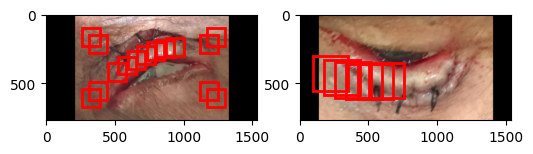

In [53]:
import albumentations as A
import cv2
import numpy as np
import matplotlib.pyplot as plt
from loaders.tt_dataset import BBXImageTrainTransform
transform = BBXImageTrainTransform()

# Apply transformations
# augmented = transform(img_padded.permute(1,2,0).numpy(), coords.numpy(), labels.numpy())

# # Extract transformed image & bounding boxes
# aug_image = augmented['image']
# aug_bboxes = augmented['bboxes']
# Show results
plt.figure(figsize=(6, 6))
plt.subplot(121)
plt.imshow(img_padded.permute(1,2,0))
for bbox in coords:
    x_min, y_min, x_max, y_max = bbox
    plt.gca().add_patch(plt.Rectangle((x_min, y_min), x_max - x_min, y_max - y_min, edgecolor='red', linewidth=2, fill=False))

plt.subplot(122)
plt.imshow(aug_image)
for bbox in aug_bboxes:
    x_min, y_min, x_max, y_max = bbox
    plt.gca().add_patch(plt.Rectangle((x_min, y_min), x_max - x_min, y_max - y_min, edgecolor='red', linewidth=2, fill=False))
plt.show()

In [35]:
pad_x, pad_y, scale_x, scale_y

(137, 0, 0.4198270126413839, 0.4201312910284464)

In [36]:
bbx_eye

tensor([   0,  990, 3006, 2818])

In [15]:
aug_image.shape

(1828, 3006, 3)

In [27]:
def extract_patches_and_labels(img, labels, coords, patch_height, patch_width):

    xmin, ymin, xmax, ymax = 0,0, img.shape[2], img.shape[1]

    patches, patches_labels = [], []
    # print(patch_height, patch_width)

    # Slide a window over the region of interest and extract patches
    for j in range(ymin, ymax-patch_height+1, patch_height):
        for i in range(xmin, xmax-patch_width+1, patch_width): 
            patch = img[:, j:j+patch_height, i:i+patch_width]
            patches.append(patch)

            find_coords = False
            for k in range(len(labels)):
                if (j <= coords[k][1] <= j+patch_height) and (i <= coords[k][0] <= i+patch_width):
                    patches_labels.append(labels[k])
                    find_coords = True
                    break

            if not find_coords:
                # print('undefined')
                # patches_labels.append(6) ## rejection, need to be better than that
                # patches_labels.append(max(labels)) # should be rejection class
                patches_labels.append(torch.tensor(-1)) # specific to undefined


    return torch.stack(patches), torch.stack(patches_labels) ## here we're streching the patches
    

In [28]:
tensor_image = torch.tensor(aug_image).permute(2,0,1)
patches, patches_labels = extract_patches_and_labels(img_cropped, labels, coords, 512, 512)

In [18]:
patches.shape

torch.Size([15, 3, 512, 512])

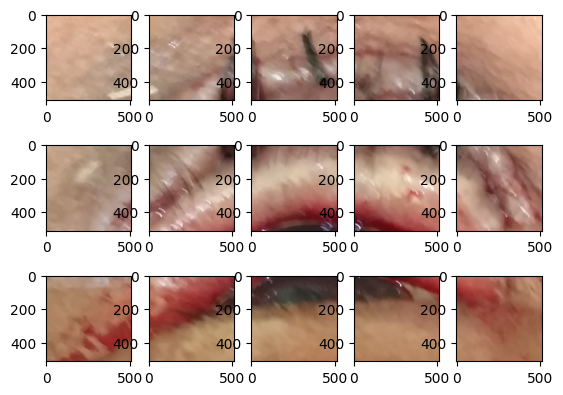

In [29]:
plt.figure()
for i in range(15):
  plt.subplot(3,5, i+1)
  plt.imshow(patches[i].permute(1,2,0))
plt.show()

In [30]:
xmin, ymin, xmax, ymax = 0,0, img.shape[0], img.shape[1]

patches, patches_labels = [], []

# Slide a window over the region of interest and extract patches
for j in range(ymin, ymax-patch_height+1, patch_height):
    for i in range(xmin, xmax-patch_width+1, patch_width): 
        patch = img[:, j:j+patch_height, i:i+patch_width]
        patches.append(patch)

        find_coords = False
        for k in range(len(labels)):
            if (j <= coords[k][1] <= j+patch_height) and (i <= coords[k][0] <= i+patch_width):
                patches_labels.append(labels[k])
                find_coords = True
                break

        if not find_coords:
            # print('undefined')
            # patches_labels.append(6) ## rejection, need to be better than that
            # patches_labels.append(max(labels)) # should be rejection class
            patches_labels.append(torch.tensor(-1)) # specific to undefined




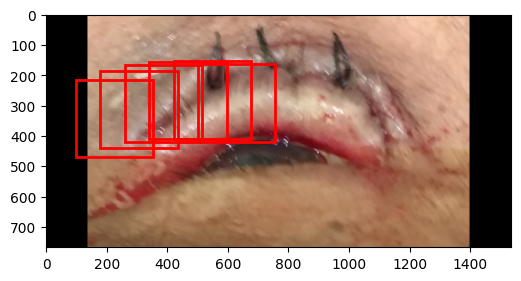

In [32]:
plt.figure(figsize=(6, 6))
plt.imshow(img_padded.permute(1,2,0))
for bbox in coords:
    x_min, y_min, x_max, y_max = bbox
    plt.gca().add_patch(plt.Rectangle((x_min, y_min), x_max - x_min, y_max - y_min, edgecolor='red', linewidth=2, fill=False))
plt.show()

In [ ]:
xmin, ymin, xmax, ymax = 0,0, aug_image.shape[2], aug_image.shape[1]

patches, patches_labels = [], []

# Slide a window over the region of interest and extract patches
for j in range(ymin, ymax-patch_height+1, patch_height):
  for i in range(xmin, xmax-patch_width+1, patch_width): 
    patch = aug_image[:, j:j+patch_height, i:i+patch_width]
    patches.append(patch)

    find_coords = False
    for k in range(len(labels)):
      x_aug_bboxes = aug_bboxes[k][0] + 
      y_aug_bboxes = aug_bboxes[k][1] +
      if (j <= coords[k][1] <= j+patch_height) and (i <= coords[k][0] <= i+patch_width):
        patches_labels.append(labels[k])
        find_coords = True
        break

    if not find_coords:
      # print('undefined')
      # patches_labels.append(6) ## rejection, need to be better than that
      # patches_labels.append(max(labels)) # should be rejection class
      patches_labels.append(torch.tensor(-1)) # specific to undefined


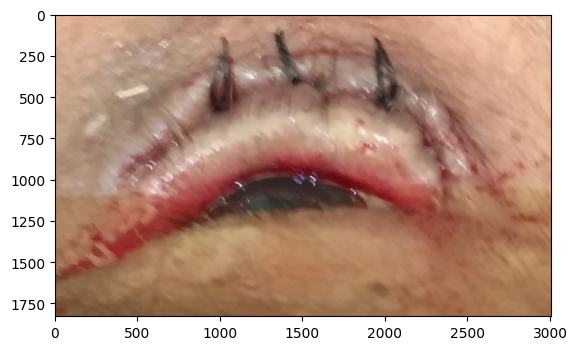

In [77]:
plt.imshow(img_cropped.permute(1,2,0))

In [12]:
# ttdata = TTDataModuleSeg(df_train, df_val, df_test, 
#                          batch_size=1, 
#                          num_workers=4, 
#                          img_column=img_column, 
#                          seg_column=seg_column, 
#                          class_column=class_column, 
#                          mount_point=mount_point, 
#                         #  train_transform=train_transform, 
#                         #  valid_transform=eval_transform, 
#                         #  test_transform=eval_transform, 
#                          drop_last=True)

# ttdata.setup()

# ds = ttdata.test_ds
# test_load = ttdata.val_dataloader()

In [13]:
# ckpt = '/CMF/data/lumargot/trachoma/output/patches/subset_models/rejection_class/HealthyXBadXReject/fold4/epoch=27-val_loss=0.36.ckpt'
# ckpt= '/work/aarcas/Fold2_TorchTrainer_2024-11-05_17-42-13/TorchTrainer_35d87_00001_1_2024-11-05_17-42-17/checkpoint_000111/checkpoint.ckpt'
ckpt = '/CMF/data/lumargot/trachoma/output/no_feat/last-v6.ckpt'
# ckpt = '/CMF/data/lumargot/trachoma/output/no_feat/epoch=2-val_loss=1.04.ckpt'
# ckpt='/CMF/data/lumargot/trachoma/output/patches/subset_models/cv2_patches/fold0/epoch=29-val_loss=0.41.ckpt'
# mone = EfficientnetV2s.load_from_checkpoint(ckpt).cuda()
# mone.eval()

# ckpt = '/work/aarcas/PoPPUnderOver/Best-TorchTrainer_61a4d_00005_5_2025-01-26_23-22-55/checkpoint_000199/checkpoint.ckpt'
model = EfficientNetV2SYOLTPatchv2.load_from_checkpoint(ckpt)
model.cuda()
model.eval()

The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=EfficientNet_V2_L_Weights.IMAGENET1K_V1`. You can also use `weights=EfficientNet_V2_L_Weights.DEFAULT` to get the most up-to-date weights.


EfficientNetV2SYOLTPatchv2(
  (loss): CrossEntropyLoss()
  (accuracy): MulticlassAccuracy()
  (F): TimeDistributed(
    (module): Sequential(
      (0): Sequential(
        (0): Conv2dNormActivation(
          (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
          (1): BatchNorm2d(32, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
          (2): SiLU(inplace=True)
        )
        (1): Sequential(
          (0): FusedMBConv(
            (block): Sequential(
              (0): Conv2dNormActivation(
                (0): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
                (1): BatchNorm2d(32, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
                (2): SiLU(inplace=True)
              )
            )
            (stochastic_depth): StochasticDepth(p=0.0, mode=row)
          )
          (1): FusedMBConv(
            (block): Sequential(
              (0): Conv2dNormActiv

In [21]:
gt, pred = torch.tensor([], dtype=int),torch.tensor([], dtype=int)
for idx, batch in enumerate(tqdm(test_load)):
  patches, labels, img = batch['patches'].cuda(), batch['labels'].cuda(), batch['img'].cuda()
  
  data = {"patches": patches, "labels": labels, "img":img}
  gt_defined_patches, pred_defined_patches = model.test_step(data, idx)

  pred = torch.cat((pred, pred_defined_patches))
  gt = torch.cat((gt, gt_defined_patches))


  0%|          | 0/1917 [00:01<?, ?it/s]


Unexpected exception formatting exception. Falling back to standard exception


Traceback (most recent call last):
  File "/home/lumargot/.local/lib/python3.9/site-packages/IPython/core/interactiveshell.py", line 3526, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "/tmp/ipykernel_1533566/932693309.py", line 6, in <module>
    gt_defined_patches, pred_defined_patches = model.test_step(data, idx)
  File "/home/lumargot/trachoma/src/py/nets/classification.py", line 2350, in test_step
  File "/tools/anaconda3/envs/flyby/lib/python3.9/site-packages/torch/nn/modules/module.py", line 1501, in _call_impl
    return forward_call(*args, **kwargs)
  File "/home/lumargot/trachoma/src/py/nets/classification.py", line 2259, in forward
    x_f = self.F(X_patches)
  File "/tools/anaconda3/envs/flyby/lib/python3.9/site-packages/torch/nn/modules/module.py", line 1501, in _call_impl
    return forward_call(*args, **kwargs)
  File "/home/lumargot/trachoma/src/py/nets/classification.py", line 521, in forward
    output = self.module(reshaped_input)
  File "/

In [19]:
df = pd.DataFrame(data={'gt':gt, 'pred':pred})
df.to_csv('test_df.csv')

In [55]:
df_pred = pd.read_csv('test_df.csv')

In [17]:
from sklearn.metrics import classification_report

In [20]:
print(classification_report(df['gt'], df['pred']))

              precision    recall  f1-score   support

           0       0.44      0.49      0.46       511
           1       0.24      0.06      0.09       372
           2       0.46      0.76      0.57       345

    accuracy                           0.43      1228
   macro avg       0.38      0.44      0.38      1228
weighted avg       0.39      0.43      0.38      1228



In [19]:
def compute_patch_size(seg, pad=10):
  seg = torch.Tensor(seg)
  shape = seg.shape[1:3]

  ij = torch.argwhere(seg.squeeze() !=0.)
  bb = torch.tensor([0, 0, 0, 0]) # xmin, ymin, xmax, ymax

  bb[0] = torch.clip(torch.min(ij[:,1]) - pad, 0, shape[1])
  bb[1] = torch.clip(torch.min(ij[:,0]) - pad, 0, shape[0])
  bb[2] = torch.clip(torch.max(ij[:,1]) + pad, 0, shape[1])
  bb[3] = torch.clip(torch.max(ij[:,0]) + pad, 0, shape[0])

  patch_w = (bb[2] - bb[0])/7

  patch_size = min(int(patch_w), 64)
  return patch_size, bb

def show_croped_seg_img(img_cropped, seg_cropped, x_axis, y_axis, pad):

  fig = plt.figure()
  ax = fig.add_subplot(1,2)
  ax[0].imshow(img_cropped.permute(1,2,0))
  plt.plot(x_axis, y_axis)

  for (x,y) in zip(x_axis, y_axis):
    rect = Rectangle(xy=(x-pad, y-pad), width=2*pad, height=2*pad,
                    fill=False, linewidth=2, color='red')

    ax[0].add_patch(rect)

  plt.xlabel("x - axis")
  plt.ylabel("y - axis")    

  ax[1].imshow(seg_cropped)
  plt.show()

def show_patches_from_polyfit(seg_cropped, pad=29, step=20, show=True, img_cropped=None):
  y, x = np.where(seg_cropped[0] == 3)	

  z = np.polyfit(x, y, 3)
  poly = np.poly1d(z)

  x_axis = np.arange(pad, seg_cropped.shape[-1]-pad , step=step)
  y_axis = poly(x_axis)

  if show:

    fig = plt.figure()
    ax = fig.add_subplot()
    ax.imshow(img_cropped.permute(1,2,0))
    plt.plot(x_axis, y_axis)

    for (x,y) in zip(x_axis, y_axis):
      rect = Rectangle(xy=(x-pad, y-pad), width=2*pad, height=2*pad,
                      fill=False, linewidth=2, color='red')

      ax.add_patch(rect)

    plt.xlabel("x - axis")
    plt.ylabel("y - axis")
    plt.show()

  return x_axis, y_axis


## extract patches from x,y
def extract_patches(img_cropped, x_list, y_list, patch_sz):
    patches = []
    for (x_center, y_center) in zip(x_list,y_list):
        y_center=int(y_center)
        y_center = max(patch_sz, y_center)
        y_center = min(img_cropped.shape[-2] - patch_sz, y_center)

        x_center = max(patch_sz, x_center)
        x_center = min(img_cropped.shape[-1] - patch_sz, x_center)
        
        patch = img_cropped[:,y_center-patch_sz:y_center+patch_sz, x_center-patch_sz:x_center+patch_sz]
        patches.append(patch)
    return torch.stack(patches, dim=0)


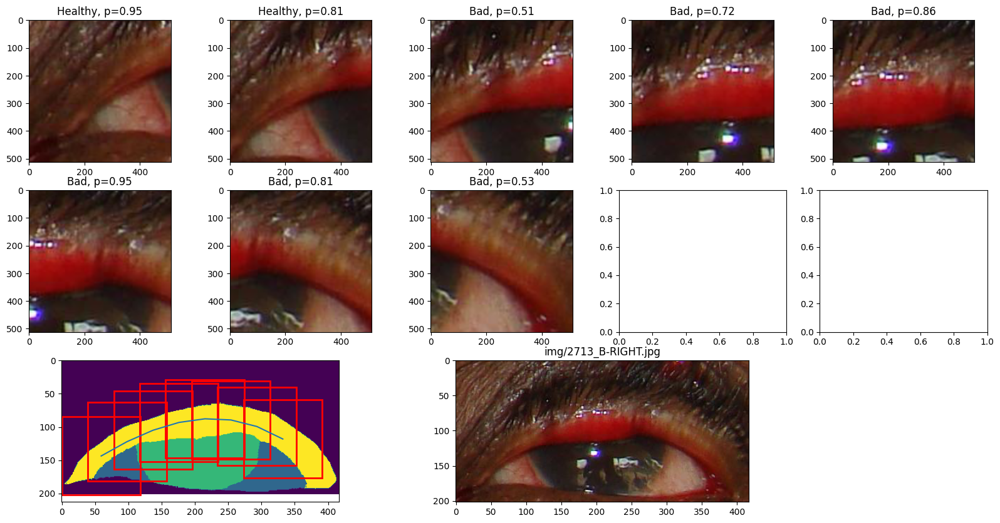

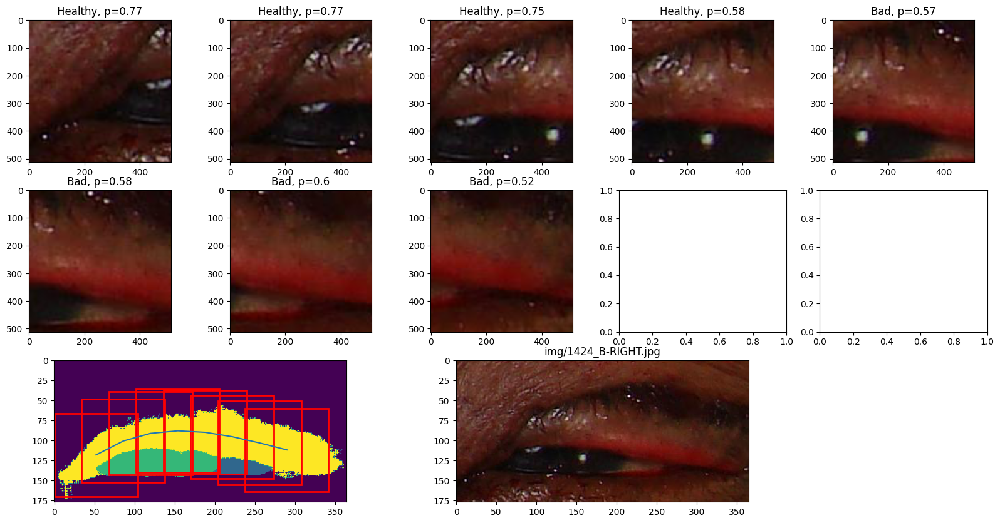

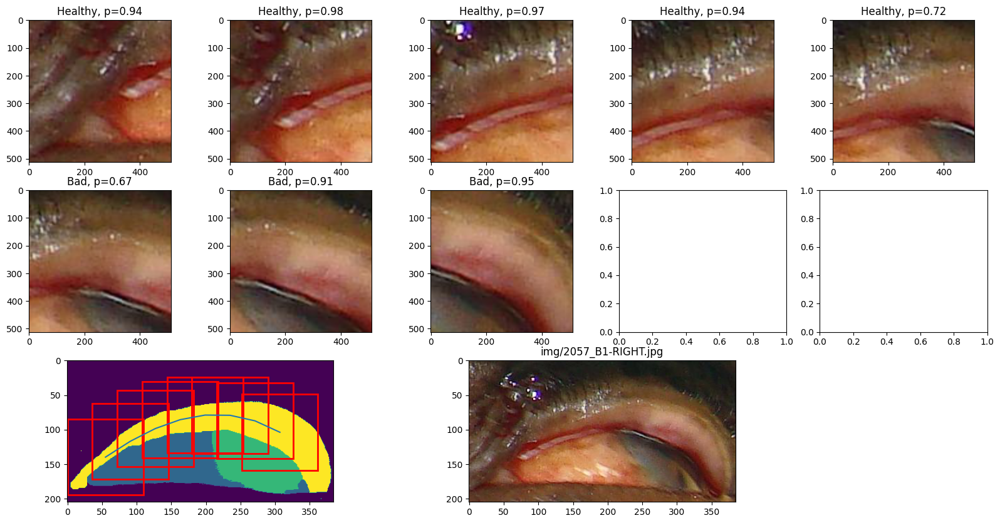

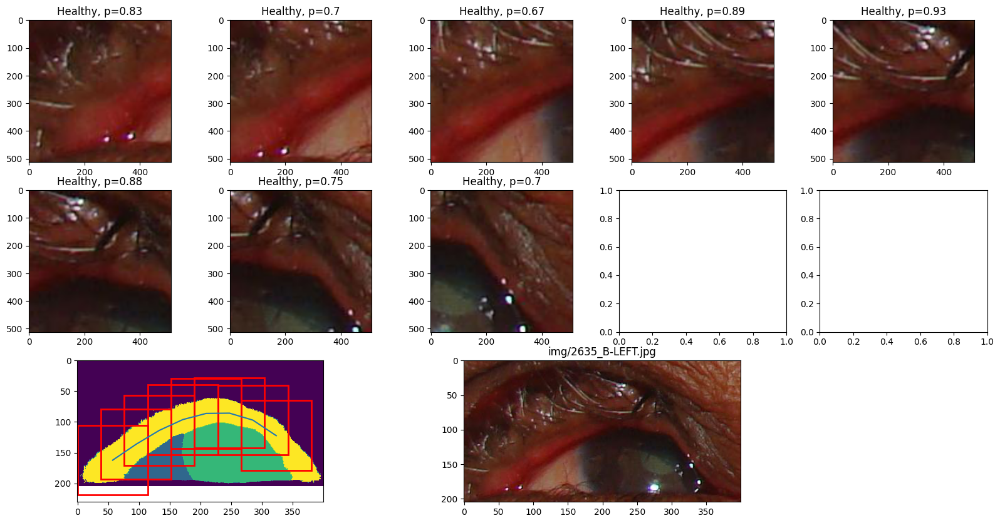

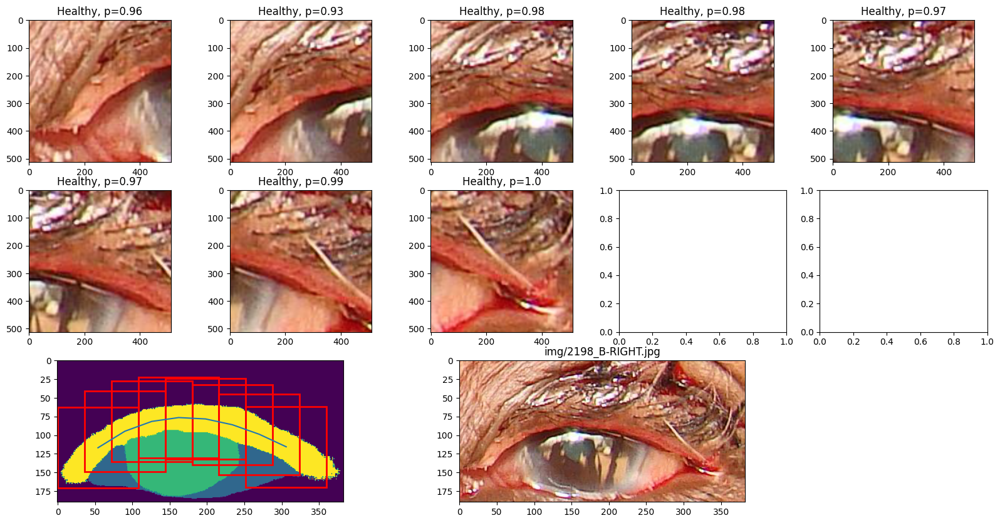

...

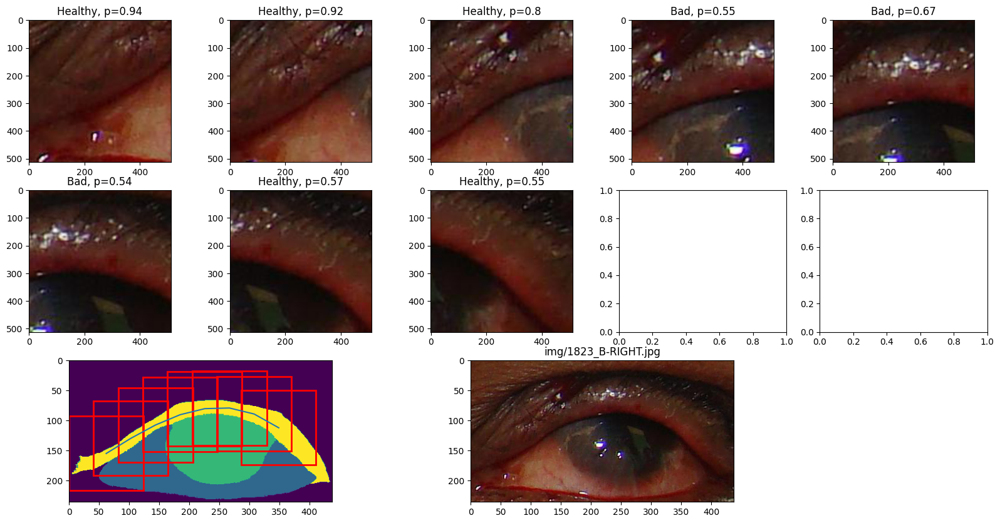

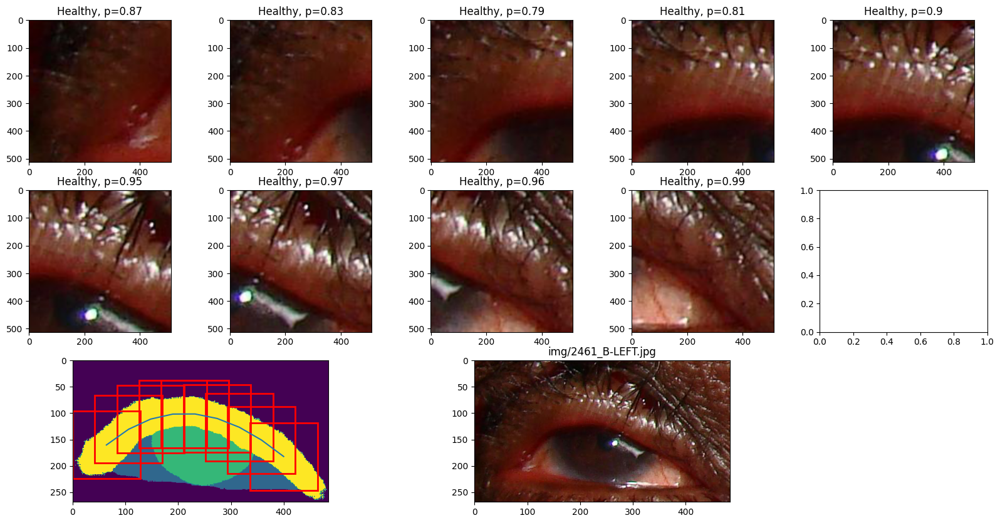

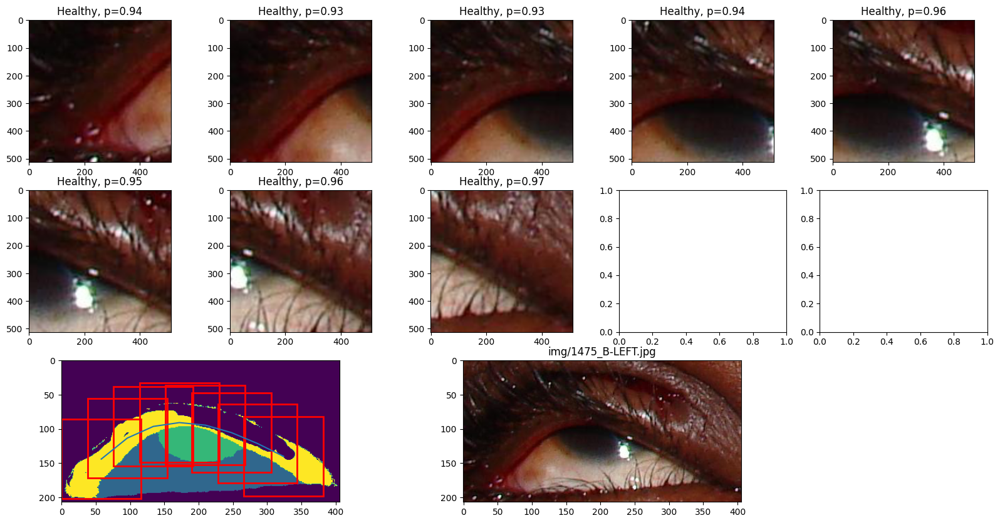

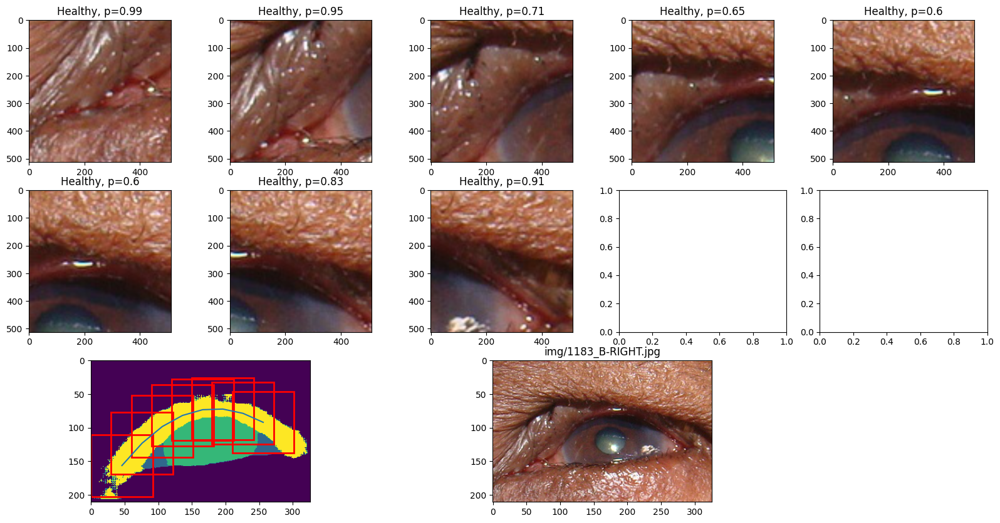

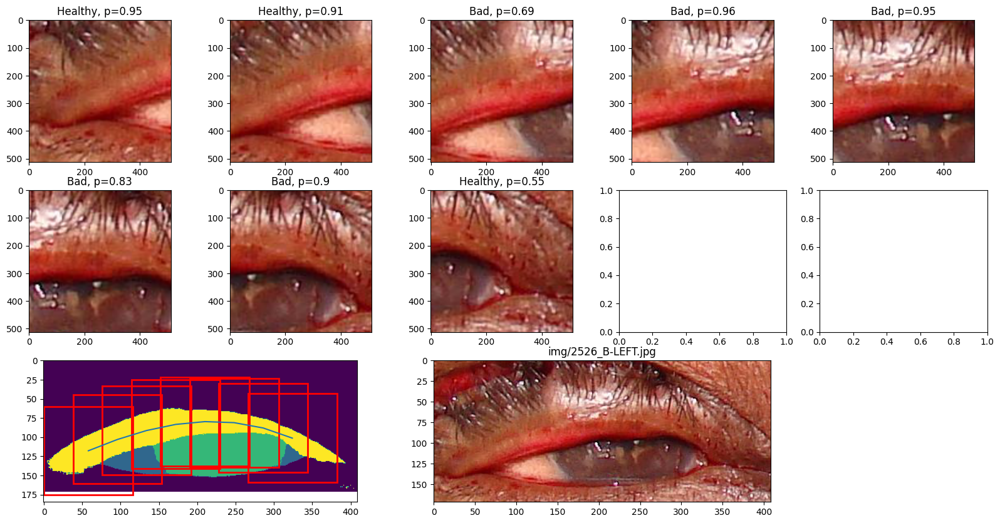

In [40]:
indices = np.arange(len(ds))

for idx in indices[0:20] :
  imgs, segs = ds[idx]['img'].unsqueeze(0), ds[idx]['seg'].unsqueeze(0)
  
  ## ------------- preprocess  -------------##
  patch_sz, bb = compute_patch_size(segs[0], pad=5)
  seg_cropped = segs[0,:, bb[1]-patch_sz:bb[3], bb[0]: bb[2]]
  img_cropped = imgs[0,: ,bb[1]-patch_sz:bb[3], bb[0]: bb[2]]
  
  eyelid = seg_cropped.clone()
  eyelid[eyelid != 3] = 0

  ## ------------- compute patches -------------##
  x_axis,y_axis = show_patches_from_polyfit(eyelid, pad=patch_sz, step=int(patch_sz/1.5), show=False)
  patches = extract_patches(img_cropped, x_axis,y_axis, patch_sz=patch_sz)
  resize_img = torchvision.transforms.Resize(512)
  patches = resize_img(patches)
  if len(patches) < 10:

    ## ------------- prediction -------------##

    output = mone(patches.cuda())

    vals, labels = torch.max(output, dim=1)
    labels = labels.cpu().numpy()
    vals = vals.detach().cpu().numpy()

    ## ------------- display of patches + prediction -------------##

    ncols=5
    nrows = int(patches.shape[0]/ncols) +2 # 1 for rounding, 1 for cropped_img
    fig, axs = plt.subplots(nrows=nrows, ncols=ncols, layout=None, figsize=(20,10))
    for i in range(patches.shape[0]):
      plt.subplot(nrows,ncols,i+1)
      plt.imshow(patches[i].permute(1,2,0))
      predicted_class = map[str(labels[i])]
      prob = str(np.around(vals[i], 2))

      plt.title(f"{predicted_class}, p={prob}")

    ## ------------- show crop image with cubes -------------##
    gs = axs[-1, -1].get_gridspec()
    for ax in axs[-1,:]:
        ax.remove()
    axbig = fig.add_subplot(gs[-1,:2])
    axbig.imshow(seg_cropped[0])
    axbig.plot(x_axis, y_axis)


    for (x,y) in zip(x_axis, y_axis):
      rect = Rectangle(xy=(x-patch_sz, y-patch_sz), width=2*patch_sz, height=2*patch_sz,
                      fill=False, linewidth=2, color='red')
      axbig.add_patch(rect)

    axbig = fig.add_subplot(gs[-1,2:4])
    axbig.imshow(img_cropped.permute(1,2,0))

    plt.title(ds.data.df.iloc[idx]['img'])


    plt.show()